enter the Length of pipe 60
enter the Inner radius 0.1
enter the Outer radius 0.15
enter the Number of internal points 100
enter the Mass flow rate of fluid 1 3
enter the Heat capacity of fluid 1 4180
enter the  Density of fluid 1 1000
enter the Mass flow rate of fluid 2 5
enter the Heat capacity of fluid 2 4180
enter the  Density of fluid 2 1000
enter the Initial temperature of fluid throughout the pipe 300
enter the Inlet temperature of fluid 1 400
enter the Inlet temperature of fluid 2 800
enter the Overall heat transfer coefficient 340


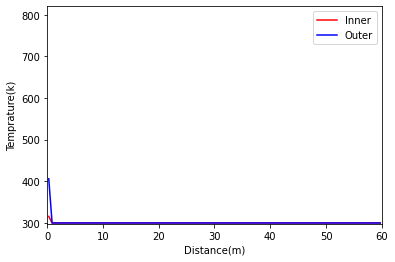

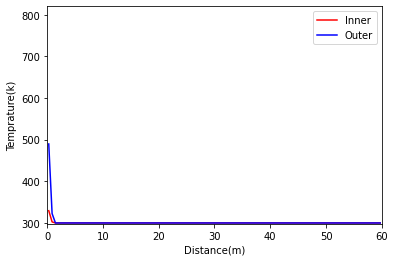

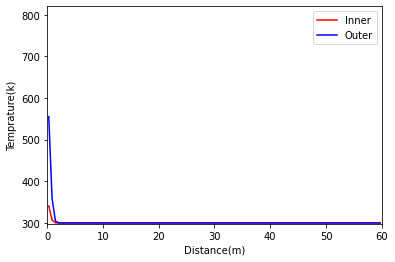

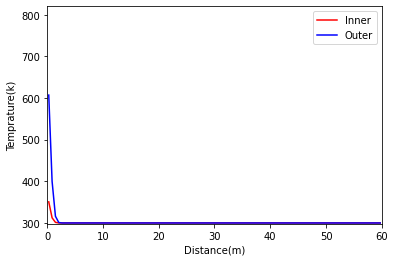

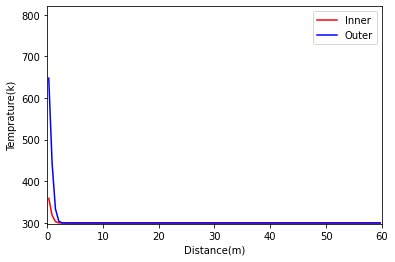

...

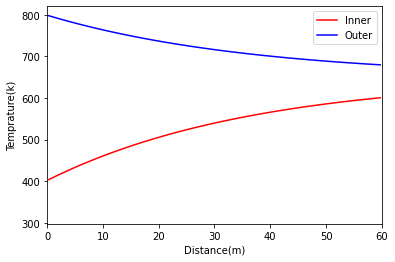

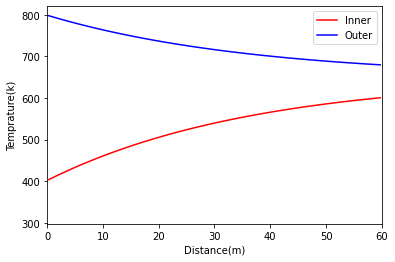

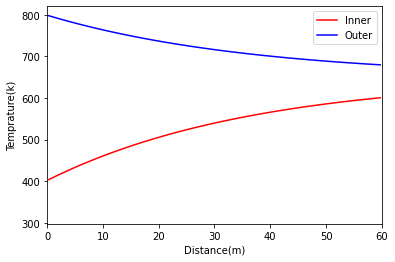

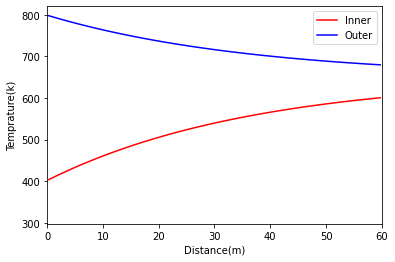

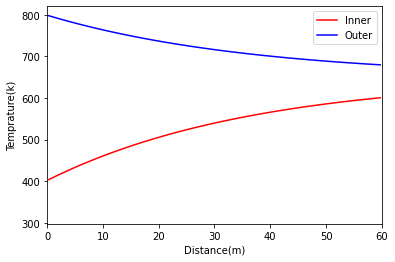

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

L=float(input("enter the Length of pipe "))
r1=float(input("enter the Inner radius "))
r2=float(input("enter the Outer radius "))
n=int(input("enter the Number of internal points "))

m1=float(input("enter the Mass flow rate of fluid 1 "))
Cp1=float(input("enter the Heat capacity of fluid 1 "))
rho1=float(input("enter the  Density of fluid 1 "))

m2=float(input("enter the Mass flow rate of fluid 2 "))
Cp2=float(input("enter the Heat capacity of fluid 2 "))
rho2=float(input("enter the  Density of fluid 2 "))

T0=float(input("enter the Initial temperature of fluid throughout the pipe "))
T1i=float(input("enter the Inlet temperature of fluid 1 "))
T2i=float(input("enter the Inlet temperature of fluid 2 "))
U=float(input("enter the Overall heat transfer coefficient "))


Ac1=3.14*r1**2
Ac2=3.14*(r2**2-r1**2)

t_final = 1000
dt=1
dx=L/n

x=np.linspace(dx/2,L-dx/2,n)
T1=np.ones(n)*T0
T2=np.ones(n)*T0

dT1dt=np.zeros(n)
dT2dt=np.zeros(n)

t=np.arange(0,t_final,dt)       
for j in range(1,len(t)):
    plt.clf()
    dT1dt[1:n]=(m1*Cp1*(T1[0:n-1]-T1[1:n])+U*2*3.14*r1*dx*(T2[1:n]-T1[1:n]))/(rho1*Cp1*dx*Ac1)
    dT1dt[0]=(m1*Cp1*(T1i-T1[0])+U*2*3.14*r1*dx*(T2[0]-T1[0]))/(rho1*Cp1*dx*Ac1)

    dT2dt[1:n]=(m2*Cp2*(T2[0:n-1]-T2[1:n])-U*2*3.14*r1*dx*(T2[1:n]-T1[1:n]))/(rho2*Cp2*dx*Ac2)
    dT2dt[0]=(m2*Cp2*(T2i-T2[0])-U*2*3.14*r1*dx*(T2[0]-T1[0]))/(rho2*Cp2*dx*Ac2)
    T1=T1+dT1dt*dt
    T2=T2+dT2dt*dt
        
    plt.figure(1)
    plt.plot(x,T1, color='red',label='Inner')
    plt.plot(x,T2,color='blue',label='Outer')
    plt.axis([0,L,298,820])
    plt.xlabel('Distance(m)')
    plt.ylabel('Temprature(k)')
    plt.legend(loc ='upper right')
    plt.show()
    plt.pause(0.005)